In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, Holt, ExponentialSmoothing
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
import matplotlib.pyplot as plt
import pmdarima as pm



from nova.clients.clients import clients

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)


# Time Series Analysis


### Efficient Market Hypothesis

"You can not Beat the Market":
    => the reason is that stock prices always reflect all available information 
    => stocks always trade at their fair value
    
    
Under 3 forms :

* Weak => Future Price can not be predicted using historical Price
* Semi-Strong => Strock prics instanly adjust to all public information
* Strong => even with all information => you still can not beat
   
### What Inforamtion

* Techincal
* Fundamentals
* Exogenous (Twitter / News / ...)
* Insider Information 

### Holt-Winters Exponential Smoothing

### ARIMA

### Exponential Smoothing

### Random Walks

### Naive Forcast

### Simple Moving Average

Let say we want to estimate mean and variance. This is needed for portfolio construction. We can use the recent average to estimate mean and variance instaid of the overall.


In [2]:
binance_client = clients(
        exchange='binance',
        key="ZKn7kXCJN8StFACpyMO28QLvrb0s1xGYRcoaA1odXth6B9iy0SkJZ09Q5MwsKrXW",
        secret=f"JRTBODVexnCmZpkIkbnVbLtghDJIZef9iSTeoj2kriufholOUCgHHIFc5m3fxoQS",
)

In [3]:
# Download Data 
btc = binance_client.get_historical_data(
    pair='BTCUSDT',
    interval='1h',
    start_ts= int(datetime(2019, 1, 1).timestamp() * 1000),
    end_ts= int(datetime(2022, 10, 1).timestamp() * 1000),
)

btc.head()

,open_time,open,high,low,close,volume,close_time,quote_asset_volume,nb_of_trades,taker_base_volume,taker_quote_volume,ignore,next_open
0,1567962000000,10000.000000,10000.000000,10000.000000,10000.000000,0.002000,1567965599999,20.0,2.0,0.001,10.000000,0,10000.000000
1,1567965600000,10000.000000,10000.000000,10000.000000,10000.000000,0.000000,1567969199999,0.0,0.0,0.000,0.000000,0,10344.769531
2,1567969200000,10344.769531,10357.530273,10337.429688,10340.120117,471.658997,1567972799999,4879792.5,562.0,0.000,0.000000,0,10340.120117
3,1567972800000,10340.120117,10368.639648,10334.540039,10351.419922,583.270996,1567976399999,6037732.5,731.0,0.034,351.971161,0,10351.419922
4,1567976400000,10351.419922,10391.900391,10324.769531,10391.900391,689.758972,1567979999999,7136798.5,827.0,0.004,41.384998,0,10392.589844


<AxesSubplot:>

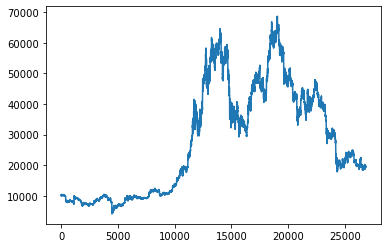

In [4]:
# plot evolution of the open price
btc['open'].plot()

In [5]:
# build Simple Moving Average
btc['sma_12'] = btc['close'].rolling(12).mean()
btc.head(20)

,open_time,open,high,low,close,volume,close_time,quote_asset_volume,nb_of_trades,taker_base_volume,taker_quote_volume,ignore,next_open,sma_12
0,1567962000000,10000.000000,10000.000000,10000.000000,10000.000000,0.002000,1567965599999,2.000000e+01,2.0,0.001000,1.000000e+01,0,10000.000000,NaN
1,1567965600000,10000.000000,10000.000000,10000.000000,10000.000000,0.000000,1567969199999,0.000000e+00,0.0,0.000000,0.000000e+00,0,10344.769531,NaN
2,1567969200000,10344.769531,10357.530273,10337.429688,10340.120117,471.658997,1567972799999,4.879792e+06,562.0,0.000000,0.000000e+00,0,10340.120117,NaN
3,1567972800000,10340.120117,10368.639648,10334.540039,10351.419922,583.270996,1567976399999,6.037732e+06,731.0,0.034000,3.519712e+02,0,10351.419922,NaN
4,1567976400000,10351.419922,10391.900391,10324.769531,10391.900391,689.758972,1567979999999,7.136798e+06,827.0,0.004000,4.138500e+01,0,10392.589844,NaN
5,1567980000000,10392.589844,10412.650391,10375.580078,10375.580078,675.393982,1567983599999,7.020273e+06,821.0,0.000000,0.000000e+00,0,10375.580078,NaN
6,1567983600000,10375.580078,10392.250000,10366.570312,10391.629883,676.205994,1567987199999,7.021684e+06,811.0,0.000000,0.000000e+00,0,10391.629883,NaN
7,1567987200000,10391.629883,10391.629883,10391.629883,10391.629883,0.000000,1567990799999,0.000000e+00,0.0,0.000000,0.000000e+00,0,10391.629883,NaN
8,1567990800000,10391.629883,10391.629883,10391.629883,10391.629883,0.000000,1567994399999,0.000000e+00,0.0,0.000000,0.000000e+00,0,10316.620117,NaN
9,1567994400000,10316.620117,10316.650391,10294.290039,10296.040039,96.461998,1567997999999,9.949136e+05,112.0,0.000000,0.000000e+00,0,10295.809570,NaN


<AxesSubplot:>

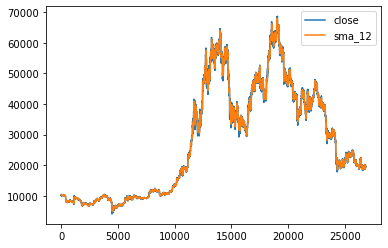

In [6]:
btc[['close', 'sma_12']].plot()

In [7]:
btc['sma_50'] = btc['close'].rolling(50).mean()

<AxesSubplot:>

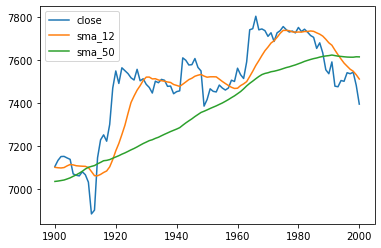

In [8]:
btc.loc[1900: 2000, ['close', 'sma_12', 'sma_50']].plot()

In [9]:
# downlaod eth and xrp data
eth = binance_client.get_historical_data(
    pair='ETHUSDT',
    interval='1h',
    start_ts= int(datetime(2019, 1, 1).timestamp() * 1000),
    end_ts= int(datetime(2022, 10, 1).timestamp() * 1000),
)

xrp = binance_client.get_historical_data(
    pair='XRPUSDT',
    interval='1h',
    start_ts= int(datetime(2019, 1, 1).timestamp() * 1000),
    end_ts= int(datetime(2022, 10, 1).timestamp() * 1000),
)

eth.shape, xrp.shape

((24933, 13), (23972, 13))

In [10]:
# combine btc and eth
combined_close = btc[['open_time', 'close']]
combined_close.columns = ['open_time', 'close_btc']

combined_close = pd.merge(combined_close, eth[['open_time', 'close']], on=["open_time"])
combined_close.columns = ['open_time', 'close_btc', 'close_eth']

combined_close.set_index('open_time', inplace=True)

combined_close.head(10)

,close_btc,close_eth
open_time,,
1574838000000,7065.069824,146.000000
1574841600000,7030.450195,133.000000
1574845200000,6882.580078,133.000000
1574848800000,6900.220215,142.619995
1574852400000,7143.750000,146.580002
1574856000000,7227.819824,147.380005
1574859600000,7251.129883,148.259995
1574863200000,7221.509766,147.649994
1574866800000,7300.020020,150.649994


In [11]:
# compute the rolling covariance between btc and eth
cov = combined_close.rolling(100).cov()
cov

close_btc     close_eth
open_time                                          
1574838000000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574841600000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574845200000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574848800000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574852400000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574856000000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574859600000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574863200000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574866800000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574870400000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574874000000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574877600000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574881200000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574884800000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574888400000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574892000000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574895600000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574899200000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574902800000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574906400000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574910000000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574913600000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574917200000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574920800000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574924400000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574928000000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574931600000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574935200000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574938800000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574942400000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574946000000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574949600000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574953200000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574956800000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574960400000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574964000000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574967600000 close_btc           NaN           NaN
              close_eth           NaN           NaN
1574971200000 close_btc           NaN           NaN
              close_eth 

In [12]:
# exponential moving average
btc['ema'] = btc['close'].ewm(min_periods=100, alpha=0.5, adjust=False).mean()

<AxesSubplot:>

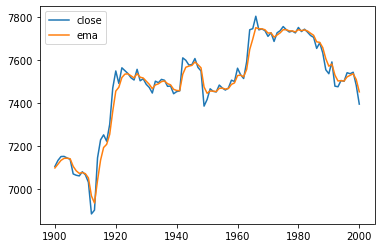

In [13]:
btc.loc[1900:2000,['close', 'ema']].plot()

In [14]:
# Exponential Smoothing for Forecasting
ses = SimpleExpSmoothing(btc['close'])
result = ses.fit(smoothing_level = 0.8, optimized = False)
btc['ses'] = result.predict(start=btc.index[0], end=btc.index[-1])

<AxesSubplot:>

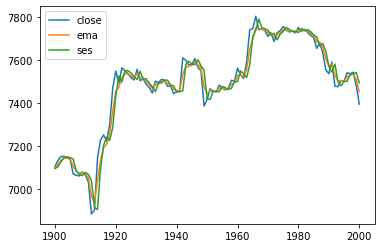

In [15]:
btc.loc[1900:2000, ['close','ema','ses']].plot()

In [16]:
n_train = 19000

train = btc.iloc[0:n_train]
test = btc.iloc[n_train:]

train.shape, test.shape

((19000, 17), (7843, 17))

<AxesSubplot:>

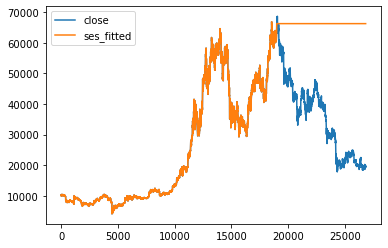

In [17]:
# Real training


ses = SimpleExpSmoothing(train['close'])
res = ses.fit()

btc.loc[:n_train, 'ses_fitted'] = res.fittedvalues
btc.loc[n_train:, 'ses_fitted'] = res.forecast(n_train)

btc[['close', 'ses_fitted']].plot()

In [18]:
# Holt's Linear Trend Model

holt = Holt(btc['close'])
result_holt = holt.fit()
btc['holt'] = result_holt.fittedvalues

/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


<AxesSubplot:>

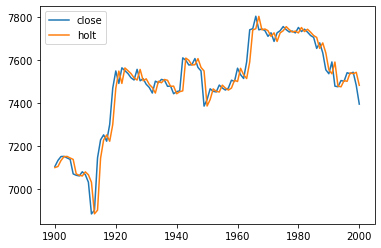

In [19]:
btc.loc[1900:2000, ['close', 'holt']].plot()

/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


<AxesSubplot:>

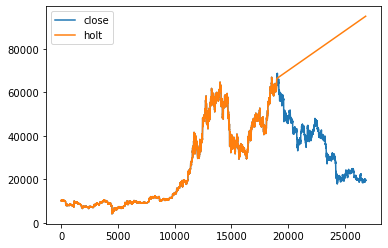

In [20]:
holt = Holt(train['close'])
result_holt_ = holt.fit()

btc.loc[:n_train, 'holt'] = result_holt_.fittedvalues
btc.loc[n_train:, 'holt'] = result_holt_.forecast(n_train)

btc[['close', 'holt']].plot()

/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


<AxesSubplot:>

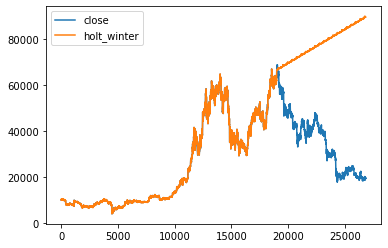

In [21]:
# Holt Winters Model -- ExponentialSmoothing

holt_winter = ExponentialSmoothing(train['close'], trend='add', seasonal='add', seasonal_periods = 400)

res_holt_winter = holt_winter.fit()


btc.loc[:n_train, 'holt_winter'] = res_holt_winter.fittedvalues
btc.loc[n_train:, 'holt_winter'] = res_holt_winter.forecast(n_train)

btc[['close', 'holt_winter']].plot()

/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


<AxesSubplot:>

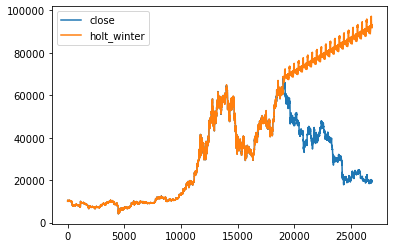

In [22]:
# Holt Winters Model -- ExponentialSmoothing

holt_winter = ExponentialSmoothing(train['close'], trend='add', seasonal='mul', seasonal_periods = 400)

res_holt_winter = holt_winter.fit()


btc.loc[:n_train, 'holt_winter'] = res_holt_winter.fittedvalues
btc.loc[n_train:, 'holt_winter'] = res_holt_winter.forecast(n_train)

btc[['close', 'holt_winter']].plot()

In [23]:
# ARIMA Models : Auto Regressive Integration Moving Average

# When Fitting ARMA model : we want the data to be close to stationary
all_lags = []

for x in [1,2,3,4]:
    
    btc[f'close_t_{x}'] = btc['close'].shift(x)
    all_lags.append(f'close_t_{x}')

n_train = 19000
train = btc.iloc[:n_train]
test = btc.iloc[n_train:]

In [24]:
arima = ARIMA(train['close'], order=(1,0,0))
arima_result = arima.fit()

/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


In [26]:
btc.loc[:n_train, 'AR_1'] = arima_result.predict(start=train.index[0], end=train.index[-1])

<AxesSubplot:>

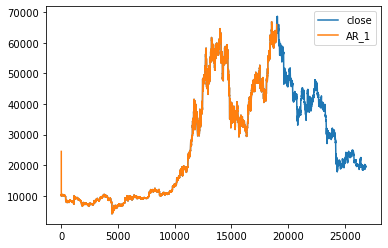

In [27]:
btc[['close', 'AR_1']].plot()

In [28]:
output = arima_result.forecast(n_train)

In [29]:
# Stationarity => Augmented Dickey-Fuller Test (ADF Test)
def adf(x):
    res = adfuller(x)
    
    print(f'Test-Statistic: {res[0]}')
    print(f'P-value: {res[1]}')
    
    if res[1]<0.05:
        print("Stationary")
    else:
        print("Non-Stationary")

adf(btc['close'])

Test-Statistic: -1.2814795365458247
P-value: 0.6376022832925271
Non-Stationary


In [31]:
btc['previous_close'] = btc['close'].shift(1)
btc['net_return'] = (btc['close'] - btc['previous_close']) / btc['previous_close']
btc['dif_price'] = btc['close'] - btc['previous_close']
adf(btc['net_return'].dropna())

Test-Statistic: -22.905240059711048
P-value: 0.0
Stationary


In [32]:
adf(btc['dif_price'].dropna())

Test-Statistic: -23.985590852871802
P-value: 0.0
Stationary


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


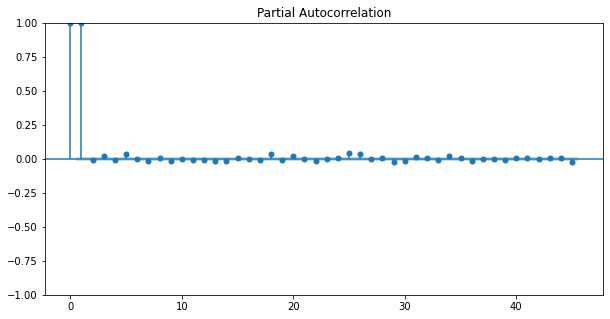

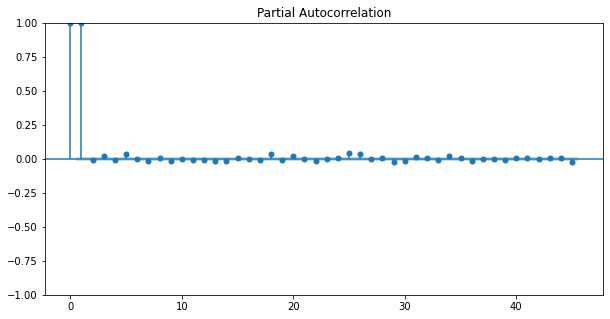

In [35]:
# Autocorrelation Function
fig, ax = plt.subplots(figsize=(10,5))

plot_pacf(btc['close'].dropna(), ax=ax)

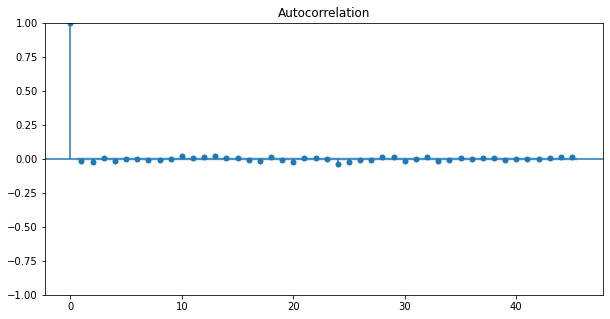

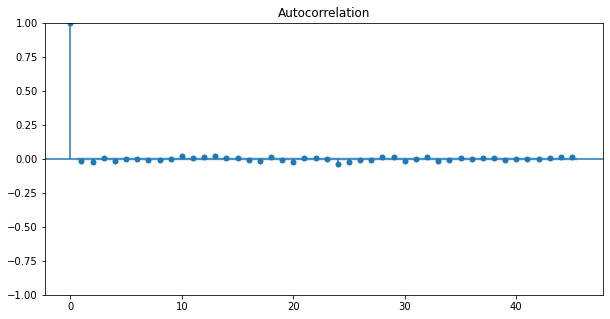

In [36]:
# Autocorrelation Function
fig, ax = plt.subplots(figsize=(10,5))

plot_acf(btc['net_return'].dropna(), ax=ax)

In [37]:
# auto arima model 

model = pm.auto_arima(train['close'],
                     trace=True,
                     suppress_warnings=True,
                     seasonal=True, m = 10)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[10] intercept   : AIC=266219.376, Time=11.78 sec
 ARIMA(0,1,0)(0,0,0)[10] intercept   : AIC=266231.375, Time=0.28 sec
 ARIMA(1,1,0)(1,0,0)[10] intercept   : AIC=266234.405, Time=1.51 sec
 ARIMA(0,1,1)(0,0,1)[10] intercept   : AIC=266234.383, Time=2.15 sec
 ARIMA(0,1,0)(0,0,0)[10]             : AIC=266231.715, Time=0.16 sec
 ARIMA(2,1,2)(0,0,1)[10] intercept   : AIC=266216.921, Time=9.69 sec
 ARIMA(2,1,2)(0,0,0)[10] intercept   : AIC=266216.040, Time=3.40 sec
 ARIMA(2,1,2)(1,0,0)[10] intercept   : AIC=266216.926, Time=9.83 sec


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,2)(0,0,0)[10] intercept   : AIC=266213.790, Time=3.56 sec
 ARIMA(1,1,2)(1,0,0)[10] intercept   : AIC=266214.849, Time=7.52 sec


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,2)(0,0,1)[10] intercept   : AIC=266214.854, Time=9.67 sec
 ARIMA(1,1,2)(1,0,1)[10] intercept   : AIC=266216.920, Time=11.19 sec
 ARIMA(0,1,2)(0,0,0)[10] intercept   : AIC=266224.249, Time=0.95 sec


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(0,0,0)[10] intercept   : AIC=266226.924, Time=2.88 sec


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,3)(0,0,0)[10] intercept   : AIC=266214.255, Time=6.86 sec


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[10] intercept   : AIC=266232.969, Time=0.62 sec
 ARIMA(0,1,3)(0,0,0)[10] intercept   : AIC=266223.414, Time=1.29 sec


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,1,1)(0,0,0)[10] intercept   : AIC=266213.370, Time=5.61 sec


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,1,1)(1,0,0)[10] intercept   : AIC=266214.448, Time=7.92 sec
 ARIMA(2,1,1)(0,0,1)[10] intercept   : AIC=266214.452, Time=7.55 sec
 ARIMA(2,1,1)(1,0,1)[10] intercept   : AIC=266216.532, Time=9.03 sec
 ARIMA(2,1,0)(0,0,0)[10] intercept   : AIC=266225.181, Time=0.70 sec


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(3,1,1)(0,0,0)[10] intercept   : AIC=266213.063, Time=6.62 sec


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(3,1,1)(1,0,0)[10] intercept   : AIC=266214.286, Time=9.89 sec


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(3,1,1)(0,0,1)[10] intercept   : AIC=266214.290, Time=10.04 sec
 ARIMA(3,1,1)(1,0,1)[10] intercept   : AIC=266216.298, Time=10.63 sec
 ARIMA(3,1,0)(0,0,0)[10] intercept   : AIC=266224.111, Time=0.86 sec


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(4,1,1)(0,0,0)[10] intercept   : AIC=266183.337, Time=1.50 sec


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(4,1,1)(1,0,0)[10] intercept   : AIC=266184.533, Time=4.07 sec
 ARIMA(4,1,1)(0,0,1)[10] intercept   : AIC=266184.527, Time=3.54 sec
 ARIMA(4,1,1)(1,0,1)[10] intercept   : AIC=266187.044, Time=4.55 sec
 ARIMA(4,1,0)(0,0,0)[10] intercept   : AIC=266181.347, Time=1.42 sec
 ARIMA(4,1,0)(1,0,0)[10] intercept   : AIC=266182.543, Time=3.74 sec
 ARIMA(4,1,0)(0,0,1)[10] intercept   : AIC=266182.536, Time=2.83 sec
 ARIMA(4,1,0)(1,0,1)[10] intercept   : AIC=266185.051, Time=4.15 sec
 ARIMA(5,1,0)(0,0,0)[10] intercept   : AIC=266183.203, Time=1.60 sec


/Users/ariisichoix/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(5,1,1)(0,0,0)[10] intercept   : AIC=266185.206, Time=1.75 sec
 ARIMA(4,1,0)(0,0,0)[10]             : AIC=266181.996, Time=0.73 sec

Best model:  ARIMA(4,1,0)(0,0,0)[10] intercept
Total fit time: 182.158 seconds


In [38]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                19000
Model:               SARIMAX(4, 1, 0)   Log Likelihood             -133084.673
Date:                Thu, 20 Oct 2022   AIC                         266181.347
Time:                        19:41:14   BIC                         266228.459
Sample:                             0   HQIC                        266196.799
                              - 19000                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      3.1291      1.969      1.589      0.112      -0.730       6.988
ar.L1         -0.0037      0.004     -1.044      0.296      -0.011       0.003
ar.L2         -0.0238      0.004     -6.536      0.000      -0.031      -0.017
ar.L3          0.0125      0.004      3.192      0.001       0.005       0.020
ar.L4         -0.0485      0.003    -14.368      0.000      -0.055      -0.042
sigma2       7.11e+04    202.757    350.681      0.000    7.07e+04    7.15e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):            503867.37
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):              39.02   Skew:                            -0.41
Prob(H) (two-sided):                  0.00   Kurtosis:                        28.22
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [43]:
test_pred, confint = model.predict(n_periods=len(btc.loc[n_train:]), return_conf_int=True)

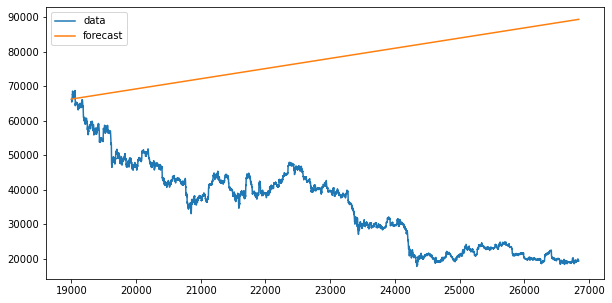

In [48]:
fig,ax = plt.subplots(figsize=(10,5))
ax.plot(test.index, test['close'], label = 'data')
ax.plot(test.index, test_pred, label = 'forecast')

# ax.fill_between(test.index,
#                 confint[:0], 
#                 confint[:,1],
#                 color='red',
#                 alpha=0.3
#                )

ax.legend();


In [46]:
# train_pred = model.predict_in_sample(start=0, end=-1)

# fig,ax = plt.subplots(figsize=(10,5))
# ax.plot(test.index, test['close'], label = 'data')
# ax.plot(test.index, test_pred, label = 'fitted')

# ax.fill_between(test.index,
#                 confint[:0], 
#                 confint[:,1],
#                 color='red',
#                 alpha=0.3
#                )

# ax.legend();
